# Latar Belakang
Sebuah perusahaan retail (supermarket) mencatat kegiatan pelanggannya dalam berbelanja pada 2 tahun terakhir. Supermarket tersebut ingin mengetahui seberapa banyak pelanggan yang aktif dalam melakukan kegiatan berbelanja. Hal ini dilakukan untuk pengetahui seberapa besar tingkat kesetiaan pelanggan untuk berbelanja pada perusahaan tersebut dan seberapa besar perusahaan dapat memberikan diskon atau keuntungan lainnya pada pelanggan yang setia berbelanja di perusahaan tersebut.

# Pernyataan Masalah

Perusahaan ingin mengetahui **seberapa besar tingkat kesetiaan pelanggan dalam berbelanja di supermarket mereka dan jenis belanjaan apa saja yang sering dibeli**. Hal ini dapat membantu perusahaan untuk fokus pada pelanggan yang lebih sering berbelanja di supermarket mereka dengan memberika diskon dan fokus pada jenis barang belanjaan apa yang paling sering dibeli sehingga perusahaan dapat mengurangi pembelian stock jenis belanjaan yang jarang dibeli

Sebagai seorang data analyst, kita akan mencoba menjawab pertanyaan berikut:

1. **Bagaimana karakteristik pelanggan yang sering melakukan pembelanjaan?**
1. **Bagaimana karakteristik pelanggan yang berbelanja ketika ada promosi?**
1. **Jenis barang belanjaan apa yang sering dibeli oleh para pelanggan?**
1. **Pada Campaign keberapa yang paling banyak diikuti?**

# Data

Untuk menjawab pertanyaan di atas, kita akan menganalisa data peserta yang sudah dikumpulkan oleh perusahaan. Dataset dapat diakses [di sini](https://drive.google.com/drive/folders/1WodnBbuYTvsF0-6HTuQABQ0KCS31lqbK).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import datetime as dt 
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

Dataset ini berisi informasi terkait personal informasi pelanggan yang diisi oleh ketika mendaftar membership dan produk yang dibeli, kegiatan belanja ketika ada event promo, dan cara berbelanja pelanggan yang didapat dari kegiatan berbelanja pelanggan dalam 2 tahun terakhir. Ada 29 kolom di dalam dataset Supermarket Customers, yaitu:<br>

**People**
- ID: kode unik setiap pelanggan
- Year_Birth: tahun kelahiran pelanggan
- Education: pendidikan terakhir pelanggan
- Martial_Status: status pernikahan pelanggan
- Income: pendapatan pelanggan dalam setahun
- Kidhome: jumlah anak kecil yang dimiliki pelanggan
- Teenhome: jumlah anak remaja yang dimiliki pelanggan
- Dt_Customer: tanggal pelanggan bergabung dengan perusahaan
- Recency: jumlah hari dari terakhir pelanggan berbelanja
- Complain: 1 jika pelanggan pernah melakukan komplain dalam 2 tahun terakhir, 0 jika sebaliknya

**Products**
- MntWines: jumlah pembelian wine pada 2 tahun terakhir
- MntFruits: jumlah pembelian buah pada 2 tahun terakhir
- MntMeatProducts: jumlah pembelian daging pada 2 tahun terakhir
- MntFishProducts: jumlah pembelian ikan pada 2 tahun terakhir
- MntSweetProducts: jumlah pembelian makanan manis pada 2 tahun terakhir
- MntGoldProds: jumlah pembelian emas pada 2 tahun terakhir

**Promotion**
- NumDealsPurchases: Jumlah pembelian menggunakan diskon
- AcceptedCmp1: 1 jika pelanggan menerima tawaran pada campaign yang pertama, 0 jika sebaliknya
- AcceptedCmp2: 1 jika pelanggan menerima tawaran pada campaign yang kedua, 0 jika sebaliknya
- AcceptedCmp3: 1 jika pelanggan menerima tawaran pada campaign yang ketiga, 0 jika sebaliknya
- AcceptedCmp4: 1 jika pelanggan menerima tawaran pada campaign yang keempat, 0 jika sebaliknya
- AcceptedCmp5: 1 jika pelanggan menerima tawaran pada campaign yang kelima, 0 jika sebaliknya
- Response: 1 jika pelanggan menerima tawaran pada campaign yang terakhir, 0 jika sebaliknya

**Place**
- NumWebPurchases: jumlah pembelian melalui website perusahaan
- NumCatalogPurchases: jumlah pembelian melalui katalog
- NumStorePurchases: jumlah pembelian melalui toko
- NumWebVisitMonth: jumlah pelanggan mengakses website perusahaan pada akhir bulan

Berikut 5 baris teratas dan terbawah dari dataset Supermarket Customers.

In [2]:
df = pd.read_csv('Supermarket Customers.csv', 
                 sep='\t', # karena pada saat diload biasa, data menyatu dengan garis '\' 
                 engine='python')
display(df.head(),df.tail())

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,...,7,0,0,0,0,0,0,3,11,1


# Data Understanding and Cleaning
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan *data understanding*. Dari proses ini, kita akan tahu anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik.

Pertama, mari kita lihat informasi umum dari dataset Supermarket Customers.

In [3]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (2240, 29)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-nul

In [4]:
display(df.describe(), df.describe(include='object'))

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


In [5]:
df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [6]:
pd.set_option('display.max_colwidth', -1)
# data uni di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,ID,2240,"[5524, 2174, 4141, 6182, 5324, 7446, 965, 6177, 4855, 5899, 1994, 387, 2125, 8180, 2569, 2114, 9736, 4939, 6565, 2278, 9360, 5376, 1993, 4047, 1409, 7892, 2404, 5255, 9422, 1966, 6864, 3033, 5710, 7373, 8755, 10738, 4339, 10755, 8595, 2968, 8601, 503, 8430, 7281, 2139, 1371, 9909, 7286, 7244, 6566, 8614, 4114, 1331, 2225, 9381, 6260, 10383, 7437, 8557, 8375, 6853, 3076, 1012, 6518, 4137, 8082, 1386, 9369, 4477, 1357, 1402, 10629, 6312, 8132, 1050, 5846, 1859, 7503, 10401, 1618, 3332, 2261, 5346, 4119, 535, 5268, 273, 4452, 8504, 771, 8996, 9235, 5798, 11178, 2230, 7516, 7247, 11100, 4646, 3037, ...]"
1,Year_Birth,59,"[1957, 1954, 1965, 1984, 1981, 1967, 1971, 1985, 1974, 1950, 1983, 1976, 1959, 1952, 1987, 1946, 1980, 1949, 1982, 1979, 1951, 1969, 1986, 1989, 1963, 1970, 1973, 1943, 1975, 1996, 1968, 1964, 1977, 1978, 1955, 1966, 1988, 1948, 1958, 1972, 1960, 1945, 1991, 1962, 1953, 1961, 1956, 1992, 1900, 1893, 1990, 1947, 1899, 1993, 1994, 1941, 1944, 1995, 1940]"
2,Education,5,"[Graduation, PhD, Master, Basic, 2n Cycle]"
3,Marital_Status,8,"[Single, Together, Married, Divorced, Widow, Alone, Absurd, YOLO]"
4,Income,1974,"[58138.0, 46344.0, 71613.0, 26646.0, 58293.0, 62513.0, 55635.0, 33454.0, 30351.0, 5648.0, nan, 7500.0, 63033.0, 59354.0, 17323.0, 82800.0, 41850.0, 37760.0, 76995.0, 33812.0, 37040.0, 2447.0, 58607.0, 65324.0, 40689.0, 18589.0, 53359.0, 38360.0, 84618.0, 10979.0, 38620.0, 40548.0, 46610.0, 68657.0, 49389.0, 67353.0, 23718.0, 42429.0, 48948.0, 80011.0, 20559.0, 21994.0, 79941.0, 41728.0, 72550.0, 65486.0, 79143.0, 35790.0, 82582.0, 66373.0, 82384.0, 70287.0, 27938.0, 55954.0, 75777.0, 66653.0, 61823.0, 67680.0, 70666.0, 25721.0, 32474.0, 88194.0, 69096.0, 74854.0, 66991.0, 65031.0, 60631.0, 28332.0, 40246.0, 75251.0, 75825.0, 26326.0, 56046.0, 29760.0, 26304.0, 23559.0, 81361.0, 29440.0, 36138.0, 50388.0, 79593.0, 54178.0, 42394.0, 23626.0, 30096.0, 47916.0, 51813.0, 78497.0, 50150.0, 47823.0, 34554.0, 85693.0, 65846.0, 87195.0, 24594.0, 49096.0, 52413.0, 38557.0, 89058.0, 77298.0, ...]"
5,Kidhome,3,"[0, 1, 2]"
6,Teenhome,3,"[0, 1, 2]"
7,Dt_Customer,663,"[04-09-2012, 08-03-2014, 21-08-2013, 10-02-2014, 19-01-2014, 09-09-2013, 13-11-2012, 08-05-2013, 06-06-2013, 13-03-2014, 15-11-2013, 10-10-2012, 24-11-2012, 24-12-2012, 31-08-2012, 28-03-2013, 03-11-2012, 08-08-2012, 06-01-2013, 23-12-2012, 11-01-2014, 18-03-2013, 02-01-2013, 27-05-2013, 20-02-2013, 31-05-2013, 22-11-2013, 22-05-2014, 11-05-2013, 29-10-2012, 29-08-2013, 31-12-2013, 02-09-2013, 11-02-2014, 01-02-2013, 29-04-2013, 12-03-2013, 05-11-2013, 02-10-2013, 28-06-2014, 09-11-2012, 24-05-2013, 01-01-2014, 08-11-2012, 12-05-2014, 11-08-2012, 07-06-2014, 12-06-2013, 19-11-2012, 02-04-2013, 28-04-2014, 17-06-2013, 03-03-2014, 04-07-2013, 07-09-2012, 18-02-2013, 11-06-2013, 06-12-2013, 21-05-2013, 11-05-2014, 19-03-2014, 27-09-2013, 08-04-2013, 11-09-2012, 14-09-2012, 17-03-2013, 05-04-2013, 30-04-2014, 19-12-2012, 27-08-2012, 12-10-2012, 04-09-2013, 29-08-2012, 23-06-2013, 03-07-2013, 25-02-2014, 11-08-2013, 16-07-2013, 28-05-2014, 21-01-2014, 27-05-2014, 23-11-2013, 23-03-2014, 24-05-2014, 22-11-2012, 11-04-2013, 01-12-2013, 20-06-2013, 23-07-2013, 30-03-2014, 20-04-2013, 17-05-2013, 08-05-2014, 10-12-2013, 24-09-2013, 02-02-2013, 07-12-2012, 02-11-2013, 10-11-2012, 25-06-2014, ...]"
8,Recency,100,"[58, 38, 26, 94, 16, 34, 32, 19, 68, 11, 59, 82, 53, 23, 51, 20, 91, 86, 41, 42, 63, 0, 69, 89, 4, 96, 56, 31, 8, 55, 37, 76, 99, 3, 88, 80, 72, 24, 92, 39, 29, 2, 54, 57, 30, 12, 18, 75, 90, 1, 25, 40, 9, 87, 5, 95, 48, 70, 79, 45, 84, 44, 43, 35, 15, 17, 46, 27, 74, 85, 65, 13, 83, 10, 21, 61, 73, 47, 36, 49, 28, 64, 98, 78, 77, 81, 14, 52, 93, 50, 60, 66, 97, 62, 6, 33, 67, 22, 71, 7]"
9,MntWines,776,"[635, 11, 426, 173, 520, 235, 76, 14, 28, 5, 6, 194, 233, 3, 1006, 53, 84, 1012, 4, 86, 1, 867, 384, 270, 36, 684, 8, 112, 110, 96, 482, 40, 702, 55, 437, 421, 13, 9, 81, 123, 48, 826, 245, 650, 12, 510, 3

Secara umum, kita bisa melihat bahwa:
* Dataset Supermarket Customers memiliki 29 kolom dan 2240 baris
* Pada kolom, yaitu, `Income` memiliki data kosong. Data kosong pada kolom-kolom tersebut diwakili dengan data NaN.
* Kolom `ID` berisikan id unik untuk tiap pelanggan, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* Kolom `Z_Revenue` dan `Z_CostContact` berisikan data yang sama untuk semua pelanggan, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* Kolom `Marital_Status` berisikan data status menikah pelanggan, yaitu Single, Together, Married, Divorced, Widow, Alone, Absurd, YOLO. Pada data ini dapat dikelompokkan menjadi Single, Married dan Divorced.
* Kolom `Year_Birth` berisikan tahun lahir pelanggan. Pada data terdapat pelanggan yang lahir pada tahun dibawah 1900, sehingga kita dapat hapus beberapa data pelanggan tersebut karena tidak mungkin ada pelanggan yang hidup lebih dari 100 tahun.
* Kolom `Dt_customer` memiliki jenis data object, sehingga perlu diubah menjadi ke type data date. Hal ini dilakukan karena data pada kolom ini akan digunakan untuk mengetahui umur pelanggan dan menjadi pertimbangan untuk menghapus data pelanggan yang memiliki usia diatas 70 tahun.
* Pada kolom `NumDealsPurchases `, `NumWebPurchases`, `NumCatalogPurchases`, `NumStorePurchases` dapat ditentukan dimana paling banyak pelanggan berbelanja. Dapat juga dibuatkan ranking berdasarkan lokasi yang paling banyak dipilih oleh pelanggan.
* Pada kolom `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds` dapat diketahui jenis produk apa yang paling sering dibeli oleh pelanggan.
* beberapa data kategorik ordinal, bisa dibuatkan kolom baru berdasarkan ranking kategorinya untuk memudahkan analisis (opsional)

## Missing Value

In [7]:
# persentase missing value di tiap kolom
df.isna().sum()/df.shape[0]*100

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

Secara garis besar:  
* *missing value* di kolom `Income` memiliki proporsi yang cukup rendah (<10%), yaitu dengan missing value mencapai 1.07%. 
* Untuk menangani *missing value* pada kolom `Income` dapat dilakukan dengan menghapus baris yang berisi *missing value* karena jumlah missing value yang tergolong cukup rendah (sampai 1.07%).

In [8]:
# menghapus baris yang memiliki nilai NaN
df.dropna(inplace = True)

In [9]:
df.isna().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

## Marital Status
Selanjutnya, kita akan menggabungkan data Alone, Absurd, dan YOLO menjadi data Single, data Together menjadi data Married dan data Widow menjadi data Divorced

In [10]:
# mengubah data pada Marital_Status sehingga hanya ada 3 jenis data saja
df['Marital_Status'].replace({'Alone':'Single', 'Absurd':'Single','YOLO':'Single',
                              'Together':'Married','Widow':'Divorced'}, inplace = True)

In [11]:
df['Marital_Status'].unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

## Drop Data
Kolom `ID` berisikan id unik untuk tiap pelanggan, sehingga tidak relevan dalam analisis dan bisa dihapus saja.<br>
Kolom `Z_Revenue` dan `Z_CostContact` berisikan data yang sama untuk semua pelanggan, sehingga tidak relevan dalam analisis dan bisa dihapus saja.

In [12]:
df.drop(['ID','Z_Revenue','Z_CostContact'], axis=1, inplace=True)

## Age
Kolom `Dt_Customer` masih bertype object, sehingga perlu diubah menjadi type date agar kita dapat membuat kolom baru yaitu `Age` untuk mengetahui umur pelanggan dan menghapus data pelanggan yang berumur lebih dari 70 tahun

In [13]:
# Saya asumsikan maximum dari Dt_Customer adalah sebagai tahun terakhir dari observasi
df.Dt_Customer = pd.to_datetime(df.Dt_Customer)
df['Age'] = (max(df.Dt_Customer.dt.year)-df.Year_Birth)

In [14]:
df['Age'].describe()

count    2216.000000
mean     45.179603  
std      11.985554  
min      18.000000  
25%      37.000000  
50%      44.000000  
75%      55.000000  
max      121.000000 
Name: Age, dtype: float64

In [15]:
# menghapus pelanggan yang memiliki umur dibawah 18 tahun dan diatas 70 tahun
Exc_Age = df[(df['Age']>70) | (df['Age']<18)].index
df.drop(Exc_Age, inplace=True)

In [16]:
# drop kolom Dt_Customer dan Year_Birth
df.drop(['Dt_Customer', 'Year_Birth'], axis=1, inplace=True)

kolom `Year_Birth` dan `Dt_Customer` dihapur karena sudah tidak digunakan dan sudah digantikan dengan kolom `Age`

In [17]:
df['Age'].describe()

count    2205.000000
mean     44.986395  
std      11.611247  
min      18.000000  
25%      37.000000  
50%      44.000000  
75%      54.000000  
max      70.000000  
Name: Age, dtype: float64

## Education

Pada kolom `Education` terdapat value **2n-Cycle** dimana memiliki tingkat pendidikan yang sama dengan **Master degree**. Sehingga value 2n-Cycle dapat kita ubah menjadi Master. Sumber dapat dibaca [disini](https://www.studera.nu/startpage/higher-education-studies/higher-education-in-sweden/study-levels-and-degrees/#:~:text=First%20cycle%20is%20for%20the,offered%20at%20all%20three%20cycles.)

In [18]:
# mengubah data 2n-Cycle pada Education menjadi Master
df['Education'].replace({'2n Cycle':'Master'}, inplace = True)

## Classification Based on Income
Kolom ini akan dinamai `Class`. Dimana setiap pelanggan akan ditentukan kelasnya menjadi low-income, middle-income, dan upper-income berdasarkan pendapat pelanggan dalam setahun. Sumber data pengklasifikasian di dapat [disini](https://money.usnews.com/money/personal-finance/family-finance/articles/where-do-i-fall-in-the-american-economic-class-system#:~:text=One%20objective%20way%20some%20researchers,upper%2Dmiddle%20class%20and%20wealthy.)

- lower-income: < 52200
- middle-income: 52201 - 156599
- upper-income: >156600

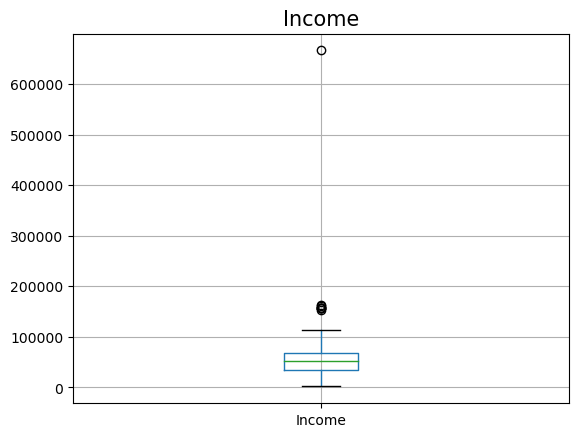

In [19]:
# cek outlier Income
df.boxplot(column = 'Income')
plt.title('Income', size = 15)
plt.savefig('Outlier Income.png')
plt.show()

In [20]:
# check index outlier
df[df['Income']==666666]

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age
2233,Graduation,Married,666666.0,1,0,23,9,14,18,8,...,3,6,0,0,0,0,0,0,0,37


In [21]:
df.drop(2233, axis=0, inplace=True)

In [22]:
kelas = []

for i in df['Income']:
    if i < 52200:
        kelas.append('lower-income')
    elif i > 156600:
        kelas.append('upper-income')
    else:
        kelas.append('middle-income')

df['Class'] = kelas

### Child

Menggabugkan data pada kolom `Kidhome` dan `Teenhome` menjadi kolom `Child` karena beranggapan sebagai jumlah anak yang tinggal bersama pelanggan.

In [23]:
# menggabungkan kolom Kidhome dan Teenhome menjadi kolom Child
df['Child'] = df['Kidhome'] + df['Teenhome']

#menghapus kolom Kidhome dan Teenhome
df.drop(['Kidhome', 'Teenhome'], axis=1, inplace=True)

# Recency

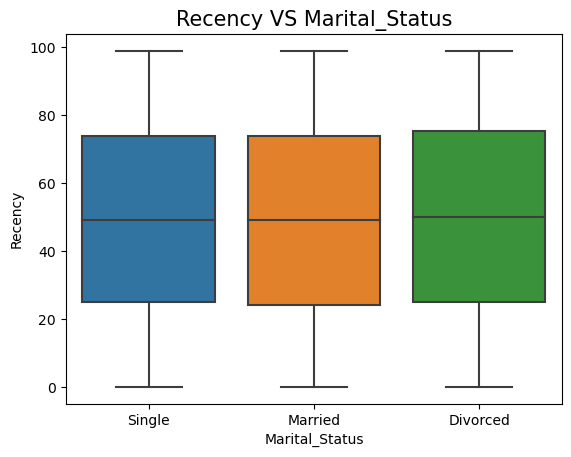

In [24]:
sns.boxplot(x = df['Marital_Status'], y = df['Recency'])
plt.title('Recency VS Marital_Status', size = 15)
plt.savefig('Recency VS Marital.png')
plt.show()

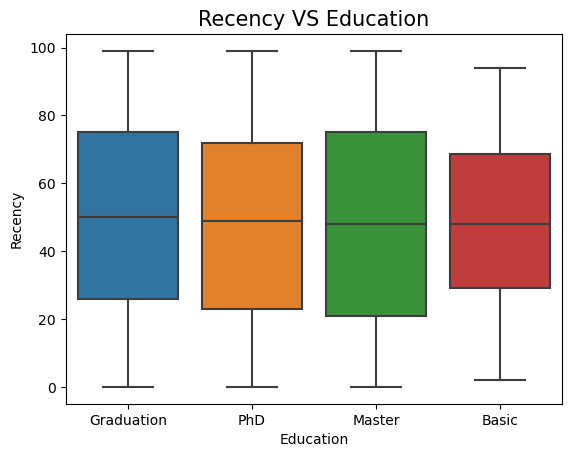

In [25]:
sns.boxplot(x = df['Education'], y = df['Recency'])
plt.title('Recency VS Education', size = 15)
plt.savefig('Recency vs Edu.png')
plt.show()

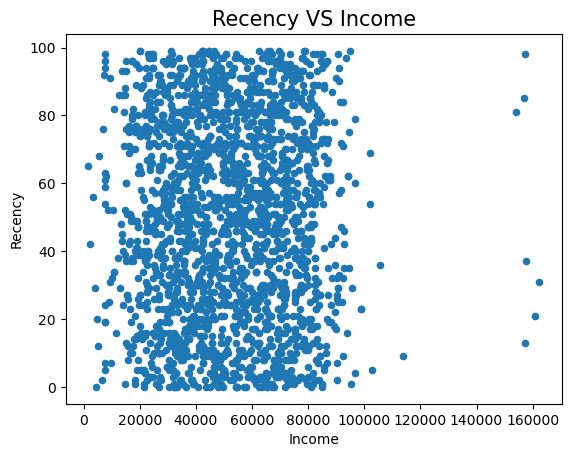

In [26]:
df.plot.scatter(x = 'Income',
                y = 'Recency')
plt.title('Recency VS Income', size = 15)
plt.savefig('Recency vs income.png')
plt.show()

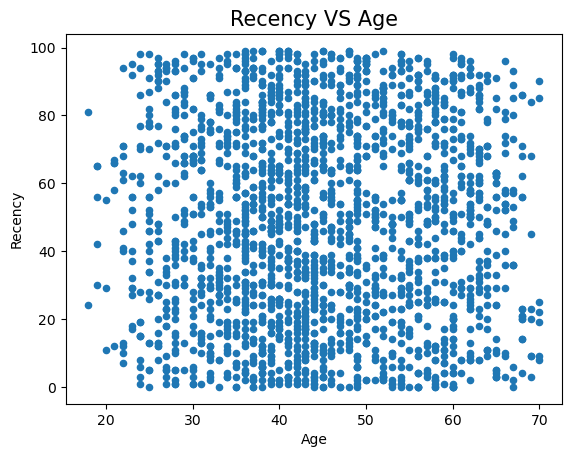

In [27]:
df.plot.scatter(x = 'Age',
                y = 'Recency')
plt.title('Recency VS Age', size = 15)
plt.savefig('rencency vs age.png')
plt.show()

Karena data pada kolom `Recency` tidak berpengaruh pada kolom `Age`, `Income`, `Marital_Status`, dan `Education` maka kolom `Recency` akan di drop

In [28]:
df.drop('Recency', axis=1, inplace=True)

# Change Name

Mengubah beberapa nama kolom agar lebih mudah dimengerti

In [29]:
df.rename(columns = {'MntWines':'Wine Products', 'MntFruits':'Fruit Products', 'MntMeatProducts':'Meat Products',
                     'MntFishProducts':'Fish Products', 'MntSweetProducts':'Sweet Products', 'MntGoldProds':'Gold Products',
                     'AcceptedCmp3':'Third Campaign', 'AcceptedCmp4':'Fourth Campaign', 'AcceptedCmp5':'Fifth Campaign',
                     'AcceptedCmp1':'First Campaign','AcceptedCmp2':'Second Campaign','Response':'Last Campaign'}, inplace=True)

# Data Bersih
Kita sudah selesai membersihkan data kita, sekarang, mari kita lihat sekilas informasi dari data yang sudah kita bersihkan

In [30]:
df.columns

Index(['Education', 'Marital_Status', 'Income', 'Wine Products',
       'Fruit Products', 'Meat Products', 'Fish Products', 'Sweet Products',
       'Gold Products', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Third Campaign', 'Fourth Campaign', 'Fifth Campaign', 'First Campaign',
       'Second Campaign', 'Complain', 'Last Campaign', 'Age', 'Class',
       'Child'],
      dtype='object')

In [31]:
df = df[['Marital_Status','Education','Age','Child','Class','Wine Products','Fruit Products','Meat Products',
        'Fish Products','Sweet Products','Gold Products','First Campaign','Second Campaign','Third Campaign',
        'Fourth Campaign','Fifth Campaign','Last Campaign']]

In [32]:
df.to_csv('Supermarket Customers Clean.csv', index=False)

In [33]:
display(df.describe(), df.describe(include='object'))

,Age,Child,Wine Products,Fruit Products,Meat Products,Fish Products,Sweet Products,Gold Products,First Campaign,Second Campaign,Third Campaign,Fourth Campaign,Fifth Campaign,Last Campaign
count,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000,2204.000000
mean,44.990018,0.950998,303.971416,26.357985,166.562160,37.431034,27.061252,43.997278,0.064428,0.013612,0.073049,0.074410,0.072142,0.150181
std,11.612635,0.748643,336.498968,39.801189,224.131724,54.642163,41.135432,51.780596,0.245570,0.115898,0.260276,0.262497,0.258781,0.357330
min,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37.000000,0.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,44.000000,1.000000,173.500000,8.000000,68.000000,12.000000,8.000000,24.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,54.250000,1.000000,505.000000,33.000000,232.000000,50.000000,33.000000,56.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,70.000000,3.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,Marital_Status,Education,Class
count,2204,2204,2204
unique,3,4,3
top,Married,Graduation,lower-income
freq,1425,1115,1127


In [34]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df.shape)
dfDesc

(2204, 17)


,dataFeatures,dataType,null,unique,uniqueSample
0,Marital_Status,object,0,3,"[Divorced, Married]"
1,Education,object,0,4,"[PhD, Master]"
2,Age,int64,0,53,"[64, 69]"
3,Child,int64,0,4,"[2, 1]"
4,Class,object,0,3,"[upper-income, middle-income]"
5,Wine Products,int64,0,772,"[74, 362]"
6,Fruit Products,int64,0,158,"[127, 41]"
7,Meat Products,int64,0,550,"[540, 717]"
8,Fish Products,int64,0,182,"[124, 61]"
9,Sweet Products,int64,0,176,"[39, 86]"


Sebelum dibersihkan, kita memiliki 2240 baris data dan 29 kolom, sekarang kita memiliki 2204 baris dan 17 kolom. Terdapat 14 baris data yang dihapus. Data yang dihapus terdiri dari data yang kosong dan data yang diluar jarak yang diinginkan (seperti berumur lebih dari 70 tahun dan dibawah 18 tahun). Sedangkan untuk kolom yang dihapus adalah kolom yang tidak relevan dalam analisis dan penambahan 2 kolom yaitu `Age` untuk membantu penghapusan data pelanggan yang berusia > 70 atau < 18 tahun dan `Class` untuk menentukan kategori kelas sosial pelanggan berdasarkan pendapatannya.

# Data Analysis


Kita sudah melakukan tahap *data cleaning*. Sekarang, kita bisa mulai melakukan analisis untuk mencari tahu **bagaimana karakteristik pelanggan yang sering berbelanja**, **bagaimana karakteristik pelanggan yang berbelanja ketika ada promosi**, dan **jenis belanjaan apa saya yang paling sering dibeli**.  

Analisis akan dilakukan dengan membandingkan data pelanggan yang berbelanja produk di supermaret dan ketika ada promosi berdasarkan fitur yang tersedia. Selain itu kita akan menganalisis produk apa saja yang paling sering dibeli oleh pelanggan dengan melihat trend setiap bulannya.

Kita perlu berhati-hati dalam melakukan analisa karena kita akan menggunakan banyak data bertipe kategorikal.

## Berdasarkan status marital: 

Pertama, mari kita lihat bagaimana pengaruh status pernikahan pelanggan terhadap keinginan pelanggan untuk berbelanja produk tertentu dan ketika saat ada promosi. Kita akan menganalisis kolom  `Martial_status`, kolom kategori produk dan kolom promosi untuk menjawab beberapa pertanyaan.

* Status pernikahan pelanggan seperti apa yang memiliki paling banyak jumlah berbelanja dan berbelanja saat ada promosi?
* Produk apa yang paling diminati oleh pelanggan dengan kategorikal marital status?
* Pada campaign keberapa pelanggan banyak melakukan pembelian?

In [35]:
df['Marital_Status'].value_counts()

Married     1425
Single      475 
Divorced    304 
Name: Marital_Status, dtype: int64

In [36]:
# untuk mencari berapa banyak produk yang dibeli oleh pelanggan disetiap kategori marital
df_mar_pdc = df.groupby('Marital_Status').sum()[['Wine Products','Fruit Products','Meat Products',
                                                 'Fish Products','Sweet Products','Gold Products']]
df_mar_pdc['Total'] = df_mar_pdc.sum(axis=1)
df_mar_pdc.sort_values('Total',ascending=False, inplace=True)
df_mar_pdc

,Wine Products,Fruit Products,Meat Products,Fish Products,Sweet Products,Gold Products,Total
Marital_Status,,,,,,,
Married,430530,36376,231198,52386,37892,61196,849578
Single,137781,12994,87575,18568,12773,20929,290620
Divorced,101642,8723,48330,11544,8978,14845,194062


In [37]:
# mencari berapa banyak campaign yang diikuti oleh pelanggan disetiap kategori marital status
df_mar_pro = df.groupby('Marital_Status').sum()[['First Campaign','Second Campaign','Third Campaign',
                                                 'Fourth Campaign','Fifth Campaign','Last Campaign']]
df_mar_pro['Total'] = df_mar_pro.sum(axis=1)
df_mar_pro.sort_values('Total',ascending=False, inplace=True)
df_mar_pro

,First Campaign,Second Campaign,Third Campaign,Fourth Campaign,Fifth Campaign,Last Campaign,Total
Marital_Status,,,,,,,
Married,94,19,100,104,108,158,583
Single,31,5,39,32,31,109,247
Divorced,17,6,22,28,20,64,157


In [39]:
ms_pdc = df_mar_pdc.reset_index()
ms_pro = df_mar_pro.reset_index()

fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(ms_pdc['Total'],
        labels=ms_pdc['Marital_Status'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('Product', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(ms_pro['Total'],
        labels=ms_pro['Marital_Status'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('Campaign', size=15)

plt.savefig('marital vs product-campaign.png')
plt.show()

In [40]:
df_mar_pdc.drop('Total',axis=1,inplace=True)

In [41]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_mar_pdc)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('status marital pelanggan berkaitan dengan produk yang dibeli')
else:
    print('status marital pelanggan tidak berkaitan dengan produk yang dibeli')

pvalue: 0.0
status marital pelanggan berkaitan dengan produk yang dibeli


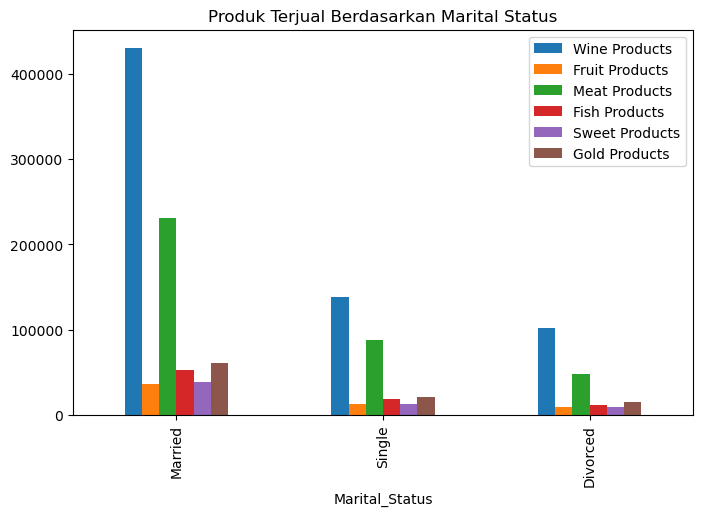

In [42]:
df_mar_pdc.plot(kind='bar',figsize=(8,5),
               title = 'Produk Terjual Berdasarkan Marital Status')
plt.savefig('marital vs produk.png')
plt.show()

In [43]:
df_mar_pro.drop('Total',axis=1,inplace=True)

In [44]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_mar_pro)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('status marital pelanggan berkaitan dengan campaign yang diikuti')
else:
    print('status marital pelanggan tidak berkaitan dengan campaign yang diikuti')

pvalue: 0.000595956889623488
status marital pelanggan berkaitan dengan campaign yang diikuti


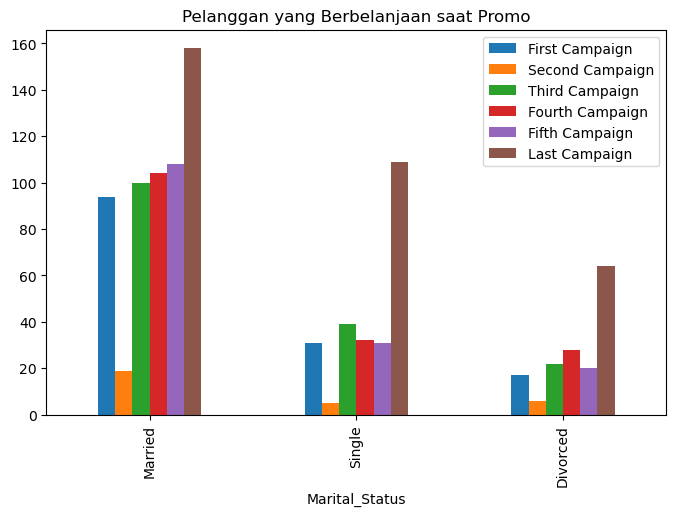

In [45]:
df_mar_pro.plot(kind='bar',figsize=(8,5),
               title = 'Pelanggan yang Berbelanjaan saat Promo')
plt.savefig('marital vs campaign.png')
plt.show()

Dapat kita lihat dari data dan grafik diatas, dapat kita simpulkan bawah:
1. Banyak dari pelanggan yang memiliki marital status menikah, yaitu sebanyak 1426 orang. Dibandingkan dengan pelanggan dengan status single sebanyak 467 orang dan divorced sebanyak 304 orang.
1. Pelanggan dengan marital status menikah adalah pelanggan yang paling banyak berbelanja dan mengikuti campaign
1. Pelanggan yang sudah menikah lebih banyak berbelanja karena disebabkan faktor bahwa ada banyak orang yang tinggal bersama dengan pelanggan yang sudah menikah (seperti suami dan anak), sedangkan untuk pelanggan yang single atau divorced memiliki jauh presentasi lebih rendah karena orang yang tinggal bersama pelanggan dalam satu rumah lebih sedikit.
1. Pelanggan yang sudah menikah lebih banyak mengikuti campaign daripada pelanggan dengan status marital lainnya. Hal tersebut mungkin terjadi karena jumlah orang dalam rumah cukup banyak sehingga mereka harus belanja saat promosi agar mendapatkan harga produk yang lebih murah dibanding biasanya.
1. Dari semua jenis produk yang dijual oleh perusahaan, produk wine adalah produk yang paling sering dibeli oleh ketiga kategori marital pelanggan. Hal ini mungkin berkaitan dengan cuaca, lingkungan, atau budaya dimana pelanggan tinggal.
1. Dari semua kegiatan campaign, campaign terakhir adalah yang paling banyak diminati oleh semua pelanggan. Hal ini mungkin terjadi karena promosi yang ditawarkan sangat menarik seperti potongan harga yang besar, cashback yang banyak, atau promo beli 1 gratis 1.
1. Banyak pelanggan yang tidak berbelanja pada promosi yang kedua. Hal tersebut mungkin terjadi karena promosi yang ditawarkan kurang menarik atau potongan harga yang diberikan tidak terlihat signifikan ketika harga produk dijual dengan harga normla

## Berdasarkan education:

Selanjutnya kita akan menganalisa berdasarkan tingkat pendidikan terakhir pelanggan. Fitur yang kita gunakan adalah kolom `Education`. Pada analisi ini kita akan mencoba menjawab beberapa pertanyaan berikut:

* Tingkat pendidikan pelanggan seperti apa yang memiliki paling banyak jumlah berbelanja dan berbelanja saat ada promosi?
* Produk apa yang paling diminati oleh pelanggan dengan kategorikal tingkat pendidikan?
* Pada campaign keberapa pelanggan banyak melakukan pembelian?


In [46]:
df['Education'].value_counts()

Graduation    1115
Master        561 
PhD           474 
Basic         54  
Name: Education, dtype: int64

In [47]:
# untuk mencari berapa banyak produk yang dibeli oleh pelanggan disetiap kategori education
df_edu_pdc = df.groupby('Education').sum()[['Wine Products','Fruit Products','Meat Products',
                                            'Fish Products','Sweet Products','Gold Products']]
df_edu_pdc['Total'] = df_edu_pdc.sum(axis=1)
df_edu_pdc.sort_values('Total',ascending=False, inplace=True)
df_edu_pdc

,Wine Products,Fruit Products,Meat Products,Fish Products,Sweet Products,Gold Products,Total
Education,,,,,,,
Graduation,318102,34427,201301,48445,34914,56551,693740
Master,159862,13618,86011,20891,14470,23977,318829
PhD,191598,9448,79173,12241,9605,15209,317274
Basic,391,600,618,921,654,1233,4417


In [48]:
# untuk mencari berapa banyak pelanggan disetiap kategori education yang berbelanja pada saat event promo
df_edu_pro = df.groupby('Education').sum()[['First Campaign','Second Campaign','Third Campaign',
                                            'Fourth Campaign','Fifth Campaign','Last Campaign']]
df_edu_pro['Total'] = df_edu_pro.sum(axis=1)
df_edu_pro.sort_values('Total',ascending=False, inplace=True)
df_edu_pro

,First Campaign,Second Campaign,Third Campaign,Fourth Campaign,Fifth Campaign,Last Campaign,Total
Education,,,,,,,
Graduation,80,16,78,79,86,152,491
PhD,30,10,38,45,37,99,259
Master,32,4,39,40,36,78,229
Basic,0,0,6,0,0,2,8


In [49]:
edu_pdc = df_edu_pdc.reset_index()
edu_pro = df_edu_pro.reset_index()

fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(edu_pdc['Total'],
        labels=edu_pdc['Education'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('Product', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(edu_pro['Total'],
        labels=edu_pro['Education'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('Campaign', size=15)

plt.savefig('edu vs product-campaign.png')
plt.show()

In [50]:
df_edu_pdc.drop('Total',axis=1,inplace=True)

In [51]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_edu_pdc)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('tingkat pendidikan pelanggan berkaitan dengan produk yang dibeli')
else:
    print('tingkat pendidikan pelanggan tidak berkaitan dengan produk yang dibeli')

pvalue: 0.0
tingkat pendidikan pelanggan berkaitan dengan produk yang dibeli


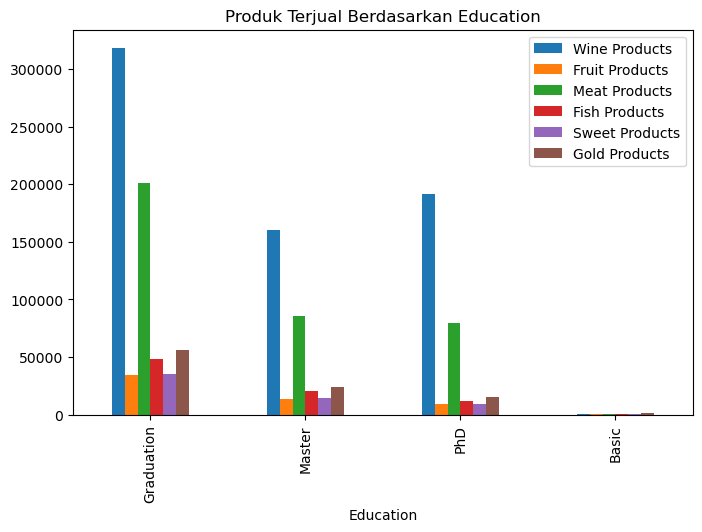

In [52]:
df_edu_pdc.plot(kind='bar',figsize=(8,5),
               title = 'Produk Terjual Berdasarkan Education')
plt.savefig('edu vs produk.png')
plt.show()

In [53]:
df_edu_pro.drop('Total',axis=1,inplace=True)

In [54]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_edu_pro)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('tingkat pendidikan pelanggan berkaitan dengan campaign')
else:
    print('tingkat pendidikan pelanggan tidak berkaitan dengan campaign')

pvalue: 0.010731482694568629
tingkat pendidikan pelanggan berkaitan dengan campaign


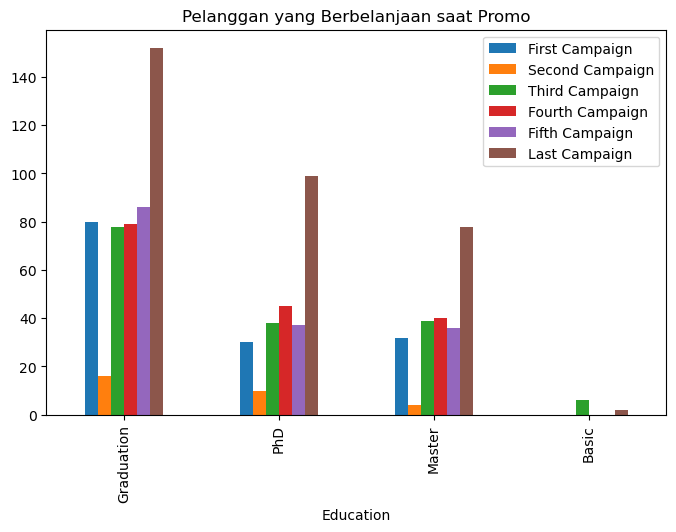

In [55]:
df_edu_pro.plot(kind='bar',figsize=(8,5),
               title = 'Pelanggan yang Berbelanjaan saat Promo')
plt.savefig('edu vs campaign.png')
plt.show()

In [56]:
df_edu_cls = pd.crosstab(df.Education, df.Class).reset_index()
df_edu_cls

Class,Education,lower-income,middle-income,upper-income
0,Basic,54,0,0
1,Graduation,560,554,1
2,Master,305,255,1
3,PhD,208,262,4


In [57]:
fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(df_edu_cls['lower-income'],
        labels=df_edu_cls['Education'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('lower-income', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(df_edu_cls['middle-income'],
        labels=df_edu_cls['Education'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('middle-income', size=15)

#Second row first column
ax1 = plt.subplot2grid((2,2),(1,0))
plt.pie(df_edu_cls['upper-income'],
        labels=df_edu_cls['Education'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('upper-income', size=15)

plt.savefig('edu vs income.png')
plt.show()

Dari data dan grafik diatas, kita simpulkan bahwa:
1. Banyak pelanggan yang berpendidikan sarjana (Graduation) dan yang paling sedikit adalah dengan pendidikan basic.
1. Pelanggan dengan tingkat pendidikan graduation adalah pelanggan terbanyak yang melakukan transaksi dan mengikuti campaign
1. Produk wine dan daging adalah 2 jenis produk yang paling banyak dibeli oleh semua pelanggan dari semua kategori education kecuali pelanggan yang memiliki education basic. Pelanggan dengan pendidikan basic kemungkinan tidak mampu membeli banyak wine dan daging dikarena pendapatan pertahun mereka yang rendah.
1. Banyak pelanggann yang berbelanja pada promosi terakhir, kecuali pelanggan dengan pendidikan basic. Hal ini dapat disebabkan oleh tingkat pendidikan, dimana pelanggan dengan tingkat pendidikan Graduation dan diatasnya sudah dapat memperhitungkan keuntungan yang didapat saat berbelanja di promosi terakhir dibanding dengan promosi sebelumnya.
1. Pada pelanggan dengan pendidikan basic, juga dapat dilihat bahwa mereka jarang berbelanja pada saat promosi. Hal ini mungkin karena pendapat pertahun mereka yang rendah atau mereka tidak dapat mengetahui apakah menguntungkan atau tidak saat berbelanja saat promosi.
1. Pada promosi kedua, hanya sedikit yang berbelanja. Hal ini mungkin disebabkan bahwa promosi yang ditawaran kurang memberi keuntungan.
1. Pelanggan dengan pendidikan basic adalah pelanggan yang paling jarang berbelanja. Jika kita telusuri lagi berdasarkan kategori kelas pendapatnya, bahwa pelanggan dengan pendidikan basic hanya berada pada kelas lower-income (pendapatan pertahunnya 0 - 52200 dollar)

## Berdasarkan class income:

Selanjutnya kita akan menganalisa berdasarkan kelas pendapatan pelanggan. Fitur yang kita gunakan adalah kolom `Class`. Pada analisi ini kita akan mencoba menjawab beberapa pertanyaan berikut:

* Tingkat pendidikan pelanggan seperti apa yang memiliki paling banyak jumlah berbelanja dan berbelanja saat ada promosi?
* Produk apa yang paling diminati oleh pelanggan dengan kategorikal tingkat pendidikan?
* Pada campaign keberapa pelanggan banyak melakukan pembelian?

In [58]:
df['Class'].value_counts()

lower-income     1127
middle-income    1071
upper-income     6   
Name: Class, dtype: int64

In [60]:
# untuk mencari berapa banyak produk yang dibeli oleh pelanggan disetiap kategori kelas pendapatan
df_cls_pdc = df.groupby('Class').sum()[['Wine Products','Fruit Products','Meat Products',
                                        'Fish Products','Sweet Products','Gold Products']]
df_cls_pdc['Total'] = df_cls_pdc.sum(axis=1)
df_cls_pdc.sort_values('Total',ascending=False, inplace=True)
df_cls_pdc

,Wine Products,Fruit Products,Meat Products,Fish Products,Sweet Products,Gold Products,Total
Class,,,,,,,
middle-income,583978,50160,321965,70240,51567,71413,1149323
lower-income,85773,7912,40182,12233,8068,25540,179708
upper-income,202,21,4956,25,8,17,5229


In [61]:
# untuk mencari berapa banyak pelanggan disetiap kategori kelas pendapatan yang berbelanja pada saat event promo
df_cls_pro = df.groupby('Class').sum()[['First Campaign','Second Campaign','Third Campaign',
                                        'Fourth Campaign','Fifth Campaign','Last Campaign']]
df_cls_pro['Total'] = df_cls_pro.sum(axis=1)
df_cls_pro.sort_values('Total',ascending=False, inplace=True)
df_cls_pro

,First Campaign,Second Campaign,Third Campaign,Fourth Campaign,Fifth Campaign,Last Campaign,Total
Class,,,,,,,
middle-income,138,26,69,138,158,205,734
lower-income,4,4,92,26,1,126,253
upper-income,0,0,0,0,0,0,0


In [62]:
cls_pdc = df_cls_pdc.reset_index()
cls_pro = df_cls_pro.reset_index()

fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(cls_pdc['Total'],
        labels=cls_pdc['Class'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('Product', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(cls_pro['Total'],
        labels=cls_pro['Class'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('Campaign', size=15)

plt.savefig('income vs produk-campaign.png')
plt.show()

In [63]:
df_cls_pdc.drop('Total',axis=1,inplace=True)

In [64]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_cls_pdc)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('kelas pendapatan pelanggan berkaitan dengan produk yang dibeli')
else:
    print('kelas pendapatan pelanggan tidak berkaitan dengan produk yang dibeli')

pvalue: 0.0
kelas pendapatan pelanggan berkaitan dengan produk yang dibeli


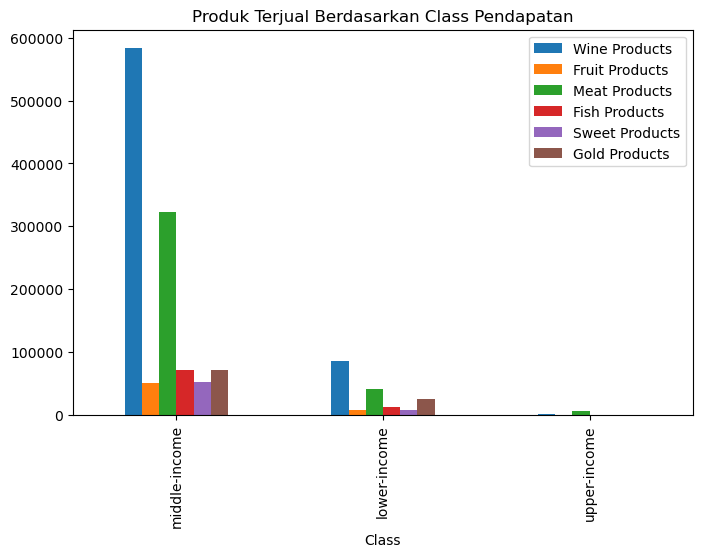

In [65]:
df_cls_pdc.plot(kind='bar',figsize=(8,5),
               title = 'Produk Terjual Berdasarkan Class Pendapatan')
plt.savefig('income vs produk.png')
plt.show()

In [66]:
df_cls_pro.drop('Total',axis=1,inplace=True)
cls_pro_upper = df_cls_pro.drop('upper-income',axis=0)

In [67]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(cls_pro_upper)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('kelas pendapatan pelanggan berkaitan dengan campaign')
else:
    print('kelas pendapatan pelanggan tidak berkaitan dengan campaign')

pvalue: 6.841005199124143e-44
kelas pendapatan pelanggan berkaitan dengan campaign


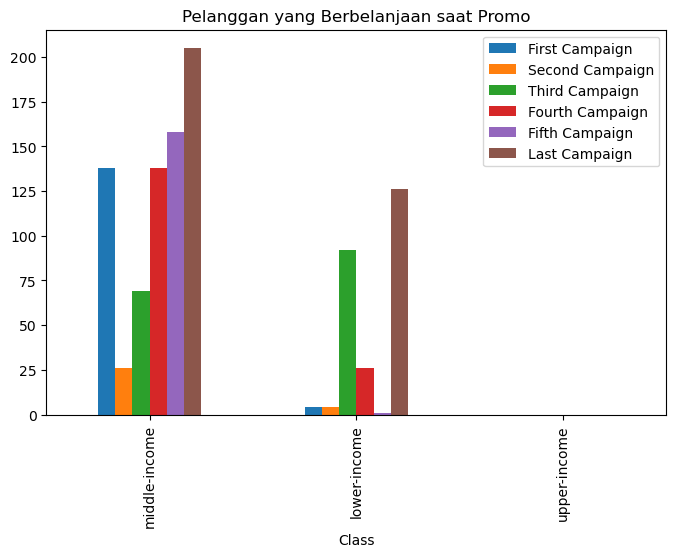

In [68]:
df_cls_pro.plot(kind='bar',figsize=(8,5),
               title = 'Pelanggan yang Berbelanjaan saat Promo')
plt.savefig('income vs campaign.png')
plt.show()

Dari data dan grafik diatas, kita dapat simpulkan bahwa:
1. Berasarkan kelas pendapatan, pelanggan yang terdaftar kebanyakan adalah pelanggan dengan pendapatan rendah (lower-income)
1. Pelanggan dengan kelas pendapatan middle-income adalah pelanggan yang paling sering melakukan transaksi dan mengikuti campaign. Hal ini terjadi karena pelanggan dengan kelas middle-income tentu lebih banyak memiliki uang dibandingkan dengan lower-income
1. Pada grafik dapat kita lihat bahwa dua produk yang sering dibeli adalah wine dan daging. Dimana pada middle-income dan lower income, produk wine menempati posisi pertama dan daging kedua. Namun pada kelas upper-income, produk daging menempati posisi pertama dan daging kedua. Hal ini mungkin terjadi karena pelanggan dengan kelas upper-income lebih suka membeli wine di perusahaan atau toko yang khusus menjual wine karen kualitas wine yang dijula lebih baik daripada di supermarket yang menjual banyak kebutuhan lain.
1. Campaign terakhir adalah promosi yang paling banyak diikuti oleh pelanggan dengan kelas pendapatn middle-income dan lower-income.
1. Pelanggan dengan pendapatan upper-income tidak pernah berbelanja pada saat promosi. Hal ini mungkin terjadi karena mereka berpendapat bahwa harga barang yang dijual saat waktu promosi dan tidak, tidak akan berdampak signifikan kepada mereka. Sedangkan bagi pelanggan dengan kelas pendapatan lower-income dan middle-income, perubahan harga barang saat promosi sangan membantu finansial mereka.

## Berdasarkan jumlah anak dirumah:

Selanjutnya kita akan menganalisa berdasarkan jumlah anak pelanggan. Fitur yang kita gunakan adalah kolom `Child`. Pada analisi ini kita akan mencoba menjawab beberapa pertanyaan berikut:

* Pelanggan yang memiliki berapa anak yang paling sering berbelanja dan mengikuti campaign?
* Produk apa yang paling diminati oleh pelanggan?
* Pada campaign keberapa pelanggan banyak melakukan pembelian?

In [69]:
df['Child'].value_counts()

1    1114
0    624 
2    416 
3    50  
Name: Child, dtype: int64

In [70]:
# untuk mencari berapa banyak produk yang dibeli oleh pelanggan disetiap kategori child
df_chl_pdc = df.groupby('Child').sum()[['Wine Products','Fruit Products','Meat Products',
                                        'Fish Products','Sweet Products','Gold Products']]
df_chl_pdc['Total'] = df_chl_pdc.sum(axis=1)
df_chl_pdc.sort_values('Total',ascending=False, inplace=True)
df_chl_pdc

,Wine Products,Fruit Products,Meat Products,Fish Products,Sweet Products,Gold Products,Total
Child,,,,,,,
0,302852,32798,231829,47615,33415,40243,688752
1,299901,21727,110789,29921,22518,45235,530091
2,59133,3269,21504,4694,3456,10586,102642
3,8067,299,2981,268,254,906,12775


In [71]:
# untuk mencari berapa banyak pelanggan disetiap kategori child yang berbelanja pada saat event promo
df_chl_pro = df.groupby('Child').sum()[['First Campaign','Second Campaign','Third Campaign',
                                        'Fourth Campaign','Fifth Campaign','Last Campaign']]
df_chl_pro['Total'] = df_chl_pro.sum(axis=1)
df_chl_pro.sort_values('Total',ascending=False, inplace=True)
df_chl_pro

,First Campaign,Second Campaign,Third Campaign,Fourth Campaign,Fifth Campaign,Last Campaign,Total
Child,,,,,,,
0,109,18,46,67,134,166,540
1,27,9,85,79,21,116,337
2,4,3,29,16,3,47,102
3,2,0,1,2,1,2,8


In [72]:
chl_pdc = df_chl_pdc.reset_index()
chl_pro = df_chl_pro.reset_index()

fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(chl_pdc['Total'],
        labels=chl_pdc['Child'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('Product', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(chl_pro['Total'],
        labels=chl_pro['Child'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1,0),
        colors = ['pink','lightblue','lightgreen','navajowhite'])
plt.title('Campaign', size=15)

plt.savefig('child vs produk-campaign.png')
plt.show()

In [73]:
df_chl_pdc.drop('Total',axis=1,inplace=True)

In [74]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_chl_pdc)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('Banyak anak yang dimiliki pelanggan berkaitan dengan produk yang dibeli')
else:
    print('Banyak anak yang dimiliki pelanggan tidak berkaitan dengan produk yang dibeli')

pvalue: 0.0
Banyak anak yang dimiliki pelanggan berkaitan dengan produk yang dibeli


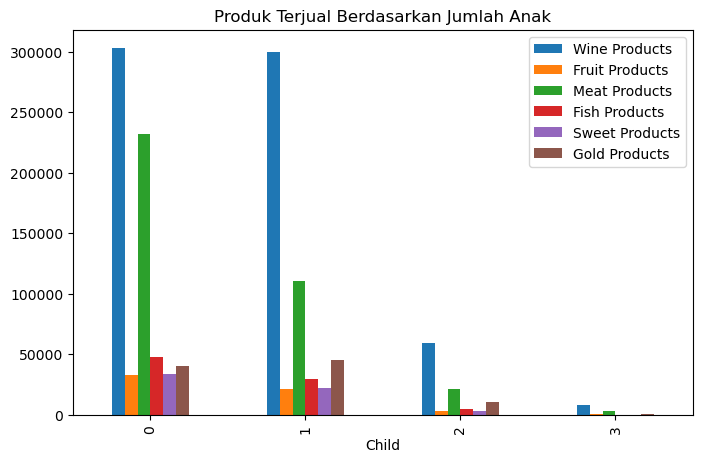

In [75]:
df_chl_pdc.plot(kind='bar',figsize=(8,5),
               title = 'Produk Terjual Berdasarkan Jumlah Anak')
plt.savefig('child vs produk.png')
plt.show()

In [76]:
df_chl_pro.drop('Total',axis=1,inplace=True)

In [77]:
# Chi-Squared Test for Independence Between Two Categorical Variable
stat, pvalue, dof, expected = chi2_contingency(df_chl_pro)

# conclusion
alpha = 0.05
print('pvalue:',pvalue)
if pvalue<0.05:
    print('kelas pendapatan pelanggan berkaitan dengan campaign')
else:
    print('kelas pendapatan pelanggan tidak berkaitan dengan campaign')

pvalue: 1.8560531868793232e-25
kelas pendapatan pelanggan berkaitan dengan campaign


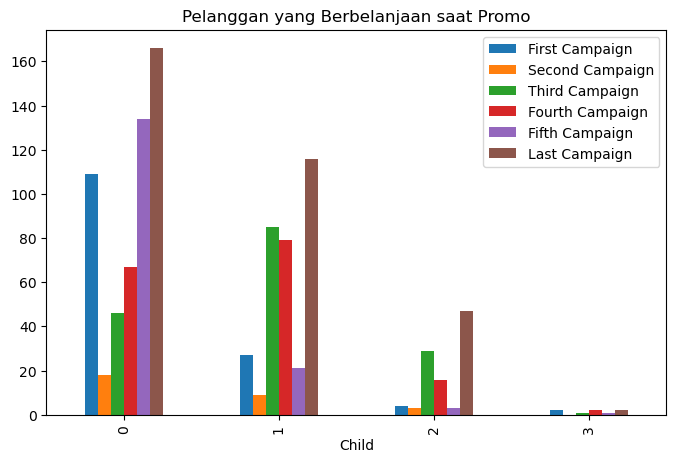

In [78]:
df_chl_pro.plot(kind='bar',figsize=(8,5),
               title = 'Pelanggan yang Berbelanjaan saat Promo')
plt.savefig('child vs campaign.png')
plt.show()

In [79]:
df_chl_cls = pd.crosstab(df.Class, df.Child).reset_index()
df_chl_cls

Child,Class,0,1,2,3
0,lower-income,151,639,303,34
1,middle-income,470,473,112,16
2,upper-income,3,2,1,0


In [80]:
fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(df_chl_cls[0],
        labels=df_chl_cls['Class'],
        autopct = '%.2f%%',
        explode = (0.1,0,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('0 Child', size=15)

#first row sec column
ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(df_chl_cls[1],
        labels=df_chl_cls['Class'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('1 Child', size=15)

#Second row first column
ax1 = plt.subplot2grid((2,2),(1,0))
plt.pie(df_chl_cls[2],
        labels=df_chl_cls['Class'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('2 Child', size=15)

#Second row second column
ax1 = plt.subplot2grid((2,2),(1,1))
plt.pie(df_chl_cls[3],
        labels=df_chl_cls['Class'],
        autopct = '%.2f%%',
        explode = (0,0.1,0.1),
        colors = ['pink','lightblue','lightgreen'])
plt.title('3 Child', size=15)

plt.savefig('child vs income')
plt.show()

Berdasarkan data dan grafik diatas, kita dapat simpulkan bahwa:
1. Banyak pelanggan yang memiliki 1 anak.
1. Pelanggan yang tidak memiliki anak, lebih banyak melakukan transaksi dan mengikuti campaign
1. Semakin banyak anak yang dimiliki oleh pelanggan, semakin sedikit pula jumlah produk yang dibeli. Hal ini berkaitan dengan income yang dihasilkan oleh pelanggan. Dimana dapat dilihat bahwa presentase middle-icome dan upper-income semakin menurun setiap bertambahnya anak, sedangkan presentase lower-income terus meningkat setiap bertambahnya anak.
1. Pada kategori jumlah anak pelanggan, banyak pelanggan yang mengikuti promosi terakhir dan banyak yang tidak mengikuti promosi yang kedua.

# Kesimpulan dan Rekomendasi 

Dari analisis yang telah dilakukan, kita bisa membuat kesimpulan berikut:
1. Dari 2205 data yang kita miliki, dapat kita tentukan karakteristik pelanggan yang sering melakukan pembelian.
    1. Banyak pelanggan yang sering melakukan pembelian adalah pelanggan yang sudah menikah.
    1. Pelanggan dengan pendidikan akhir Graduation adalah pelanggan yang sering berbelanja karena memang mayoritas pelangga yang terdaftar adalah lulusan graduation.
    1. Pelanggan dengan pendidikan basic adalah pelanggan yang paling jarang melakukan pembelanjaan karena pelanggan pada kategori hanya ada pada kelas pendapatan lower-income.
    1. Pada kelas pendapatan, kebanyakan pelanggan berada pada kelas lower-income. Namun pada kenyataannya, pelanggan dengan kelas pendapatan middle-income adalah kategori pelanggan yang paling sering melakukan pembelian.
    1. Semakin sedikit anak yang dimiliki pelanggan, semakin sering pula pelanggan melakukan pembelanjaan.

1. Dari 2205 data yang kita miliki, dapat kita tentukan bahwa karakteristik pelanggan yang sering mengikuti campaign.
    1. Banyak pelanggan dengan karateristik menikah adalah pelanggan yang sering mengikuti campaign.
    1. Begitu pula dengan semakin sedikit anak yang dimiliki, semakin banyak pula pelanggan yang mengikuti campaign.
    1. Pada pelanggan dengan pendidikan diatas basic, banyak yang mengikuti campaign karena dengan ilmu yang dimiliki dapat mengetahui seberapa menguntungkannya berbelanja ketika ada campaign atau tidak ada campaign.
    1. Jika dilihat dari kategori kelas pendapatan, pelanggan dengan kelas middle-income dan lower-income adalah pelanggan yang banyak mengikuti campaign dibandingkan dengan kelas upper-income. Hal ini mungkin terjadi karena:
        1. Pelanggan dengan upper-income melihat bahwa harga produk saat campaign tidak terlalu berdampak.
        1. Sedikit pelanggan upper-income yang terdaftar sebagai pelanggan.
    
1. Dari 2205 data yang kita miliki, dapat kita tentukan bahwa produk yang paling sering dibeli adalah produk wine dan produk yang jarang dibeli ada produk fruit.
    1. Menurut [https://www.alcoholandyouni.com/](https://www.alcoholandyouni.com/9-reasons-people-drink/#:~:text=People%20generally%20tend%20to%20drink,relax%20and%20have%20more%20fun.), alasan produk wine paling sering dibeli oleh pelanggan adalah karena past experience, stress, social norm, enviroment, accessibility, as an act of rebellion, peer pressure, and for fun.
    1. Menurut [https://alcohol.org/](https://alcohol.org/guides/beer-wine-production-consumption-worldwide/) Wine adalah produk yang cukup banyak dikonsumsi oleh banyak orang didunia. Sebagai contoh adalah US sebagai negara paling banyak mengkonsumsi wine dengan rate pertahun mencapai 4.3 Miliar botol wine pertahun.
    
1. Dari 2205 data yang dimiliki, dapat kita tentukan bahwa promosi yang terakhir adalah promosi yang paling banyak diikuti oleh pelanggan.
    1. Dapat dilihat bahwa dari segala jenis karakteristik pelanggan, promosi yang paling banyak diikuti adalah promosi pada campaign terakhir.
    1. Menurut [https://inmarketing.id/](https://inmarketing.id/strategi-marketing-campaign-terbaik.html), ada beberapa hal yang perlu diperhatikan dalam membuat strategi campaign, yaitu tentukan tujuan marketing, jangan ketinggalan tren, berpikir kreatif, dan pilih saluran pemasaran yang tepat. Dapat kita simpulkan bahwa pada campaign terakhir, poin-poin diatas sudah memenuhi.
    1. Pada campaign kedua, hanya sedikit pelanggan yang mengikuti campaign. Hal ini mungkin terjadi karena 4 poin yang disebutkan tadi kurang terpenuhi

**Rekomendasi**

1. Pelanggan dengan status marital divorced dan single dapat menjadi fokus utama pemberian iklan agar menjadi sering berbelanja di supermarket.
1. Pada pelanggan dengan pendidikan diatas basic dapat juga menjadi fokus utama dalam pemberian iklan karena banyak pelanggan dengan pendidikan diatas basic masuk kedalam kategori kelas pendapatan middle-income.
1. Perusahaan dapat melakukan penambahan jumlah produk wine dan daging karena 2 produk tersebut yang paling sering dibeli atau mengurangi stock produk buah dan manisa karena 2 produk tersebut yang paling jarang dibeli.
1. Untuk kedepannya dalam membuat campaign, peusahaan dapat meniru atau menjadikan campaign terakhir sebagai acuan dan mengindari strategi pada campaign kedua karena campaign tersebut adalah yang paling sedikit diikuti.